In [1]:
import pandas as pd
import sys


sys.path.append('../../')
from src.plot_helpers import plot_experiment_range,plot_correlation_matrix
from src.transform import transform_diff_avg,load_json

smart_sense_cols = load_json("../../json/locations.json")["smart_sense"]

## Load data

In [2]:
df = pd.read_csv('../../data/clean_data/all_sensors.csv',index_col=0,parse_dates=True,low_memory=False)
df

,aqi_palas,averaging,cn,co,co2,dcn,formaldehyde,global_error,humidity,infection_risk_index,...,temperature,tvoc,tvoc_mg,tvoc_ppb,volume_flow,x10_dcn,x16_dcn,x50_dcn,x84_dcn,x90_dcn
2024-10-11 13:24:18,NaN,NaN,NaN,NaN,566.00,NaN,3.0,NaN,58.00,NaN,...,20.50,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-10-11 13:33:57,NaN,NaN,NaN,NaN,528.00,NaN,11.0,NaN,58.00,NaN,...,21.00,87.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-10-11 13:43:57,NaN,NaN,NaN,NaN,596.00,NaN,36.0,NaN,57.00,NaN,...,22.20,103.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-10-11 13:44:34,NaN,NaN,NaN,NaN,675.00,NaN,42.0,NaN,57.00,NaN,...,22.70,103.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-10-11 13:54:27,NaN,NaN,NaN,NaN,701.00,NaN,41.0,NaN,57.00,NaN,...,23.00,102.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-11-05 16:17:00,56.47,60.0,1112.10,NaN,996.77,->,NaN,0.0,51.54,1.45,...,22.17,NaN,0.06,NaN,1.0,0.19,0.2,0.24,0.3,0.34
2024-11-05 16:18:00,58.78,60.0,1140.10,NaN,1025.73,->,NaN,0.0,50.25,1.49,...,22.78,NaN,0.09,NaN,1.0,0.19,0.2,0.24,0.3,0.33
2024-11-05 16:19:00,60.80,60.0,1142.41,NaN,1034.32,->,NaN,0.0,51.30,1.53,...,23.02,NaN,0.09,NaN,1.0,0.19,0.2,0.24,0.3,0.33
2024-11-05 16:20:00,62.53,60.0,1154.18,NaN,1011.70,->,NaN,0.0,48.37,1.53,...,23.13,NaN,0.07,NaN,1.0,0.19,0.2,0.24,0.3,0.33


In [3]:
df_smart_sense = df.loc[df['sensor'] == 'smart_sense'][smart_sense_cols]
df_smart_sense

,co2,temperature,humidity,nox,tvoc,pm_1.0,pm_2.5,pm_10
2024-10-11 10:47:00,636.0,19.94,70.35,1.0,64.0,2.8,3.5,3.9
2024-10-11 10:48:00,652.0,20.03,70.20,1.0,71.0,3.0,4.5,5.7
2024-10-11 10:49:00,670.0,20.10,70.41,1.0,77.0,2.8,3.6,4.0
2024-10-11 10:50:00,696.0,20.19,70.14,1.0,81.0,2.8,3.6,4.0
2024-10-11 10:51:00,726.0,20.26,69.91,1.0,83.0,3.5,5.2,6.3
...,...,...,...,...,...,...,...,...
2024-10-31 11:23:00,790.0,23.30,56.60,2.0,459.0,14.9,23.3,25.3
2024-10-31 11:24:00,801.0,23.32,56.67,2.0,462.0,15.2,23.8,25.9
2024-10-31 11:25:00,799.0,23.36,56.72,2.0,465.0,15.0,23.5,25.5
2024-10-31 11:26:00,804.0,23.37,56.79,2.0,467.0,15.0,23.5,25.5


## Correlation matrix

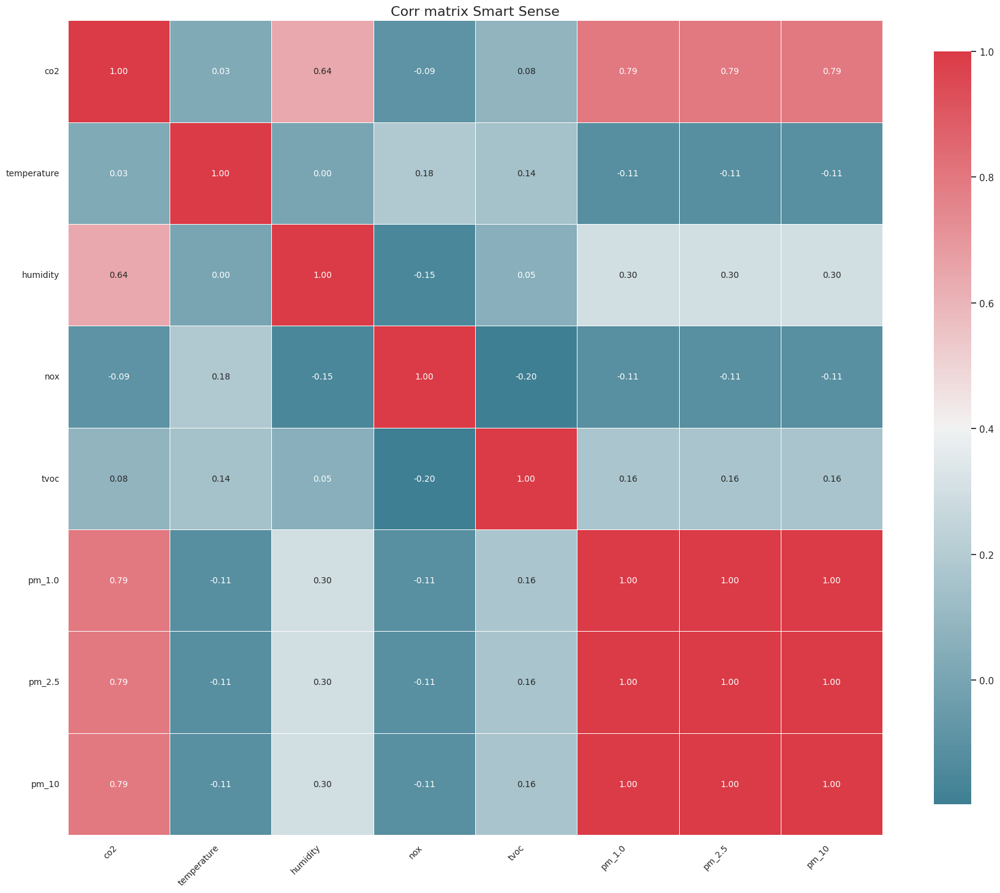

In [4]:
plot_correlation_matrix(df=df_smart_sense.corr(),title=f"Corr matrix Smart Sense")

## PAHs

### Time series plots

In [5]:
plot_experiment_range(df=df_smart_sense.resample('240s').mean(),col_names=['pm_10','pm_1.0','pm_2.5'])


### diff percentage plot

In [6]:
plot_experiment_range(df=df_smart_sense.resample('240s').mean().pct_change() * 100,col_names=['pm_10','pm_1.0','pm_2.5'])

/tmp/ipykernel_2069808/3197533296.py:1: FutureWarning:

The default fill_method='pad' in DataFrame.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.



## CO2

### Time series

In [7]:
plot_experiment_range(df=df_smart_sense.resample('240s').mean(),col_names=['co2'])

### diff plot

In [8]:
plot_experiment_range(df=df_smart_sense.resample('240s').mean().pct_change() * 100,col_names=['co2'])

/tmp/ipykernel_2069808/934623957.py:1: FutureWarning:

The default fill_method='pad' in DataFrame.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.



## Temperature and Humidity

### time series plot

In [9]:
plot_experiment_range(df=df_smart_sense.resample('240s').mean(),col_names=['temperature','humidity'])



## NOC and VOC index

### time series plot

In [11]:
plot_experiment_range(df=df_smart_sense.resample('240s').mean(),col_names=['tvoc','nox'],min_value=0,max_value=210)

### diff plot

In [12]:
plot_experiment_range(df=df_smart_sense.resample('240s').mean().pct_change() * 100,col_names=['tvoc','nox'],min_value=0,max_value=210)

/tmp/ipykernel_2069808/2309873026.py:1: FutureWarning:

The default fill_method='pad' in DataFrame.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.



## Overall analysis

In [13]:
diff_df = transform_diff_avg(df_smart_sense.resample('240s').mean())
diff_df.dropna(axis=1,inplace=True)

/home/usr1_tt/collocation_study/notebooks/sensor/../../src/transform.py:16: FutureWarning:

The default fill_method='pad' in DataFrame.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.



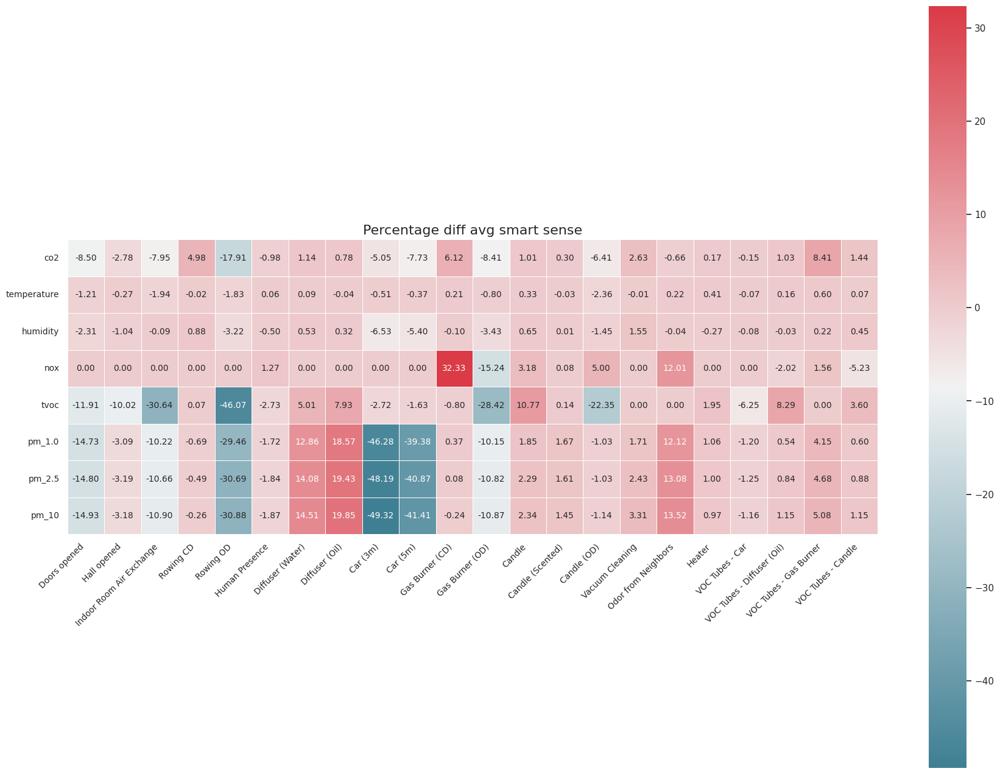

In [14]:
plot_correlation_matrix(diff_df,title="Percentage diff avg smart sense")